In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
from plotly.offline import iplot, plot
import plotly.express as px

import glob
import os

plt.rcParams["figure.figsize"] = 16,10

## Read Data

In [2]:
#list path

In [48]:
os.listdir("../data/raw_data_train/")

['rsq_q1', 'rsq_q2', 'rsq_q3']

In [49]:
os.listdir("../data/raw_data_train/rsq_q1/")

['Accelerometer.csv',
 'Gyroscope.csv',
 'Linear Accelerometer.csv',
 'Location.csv']

In [110]:
pd.read_csv(glob.glob("../data/raw_data_train/rsq_q1/*")[3])

,Time (s),Latitude (°),Longitude (°),Height (m),Velocity (m/s),Direction (°),Horizontal Accuracy (m),Vertical Accuracy (°)
0,0.000000,47.696266,17.726061,118.349480,-1.000000,-1.000000,418.967358,418.967358
1,1.774932,47.695267,17.724532,120.897892,10.737622,-1.000000,48.000000,48.000000
2,2.774925,47.695335,17.724412,103.454252,11.802929,-1.000000,32.000000,32.000000
3,3.774918,47.695273,17.724272,114.860346,11.802929,-1.000000,32.000000,32.000000
4,4.774910,47.695239,17.724124,116.224856,12.074264,-1.000000,16.000000,16.000000
...,...,...,...,...,...,...,...,...
626,627.819389,47.705068,17.716240,118.630658,6.965403,185.857483,12.001812,12.001812
627,628.819413,47.705065,17.716240,118.688638,4.823735,185.857483,12.001812,12.001812
628,629.819440,47.705022,17.716237,118.746758,0.121996,182.292480,8.001208,8.001208
629,630.819464,47.705017,17.716237,118.814684,0.118004,182.292480,8.001208,8.001208


In [51]:
path = "../data/raw_data_train/rsq_q1/*"

In [115]:
for path in glob.glob(path):
    print(path)

../data/raw_data_train/rsq_q1\Location.csv


In [117]:
path.split('.csv')[0].split("\\")[1]

'Location'

In [157]:
def read_measurement(path):
    df = pd.DataFrame()
    c = 0
    for path in glob.glob(path):
        
        new_df = pd.read_csv(path)
        new_df["sensor"] = path.split('.csv')[0].split("\\")[1]
        
#         if c >= 1:
#             new_df.drop("Time (s)", axis = 1, inplace = True)

        
        df = pd.concat([new_df,df], axis=0)
        
            
        print(path)
        
        c+=1
    
    return df
        

In [158]:
df = read_measurement("../data/raw_data_train/rsq_q1/*")

../data/raw_data_train/rsq_q1\Accelerometer.csv
../data/raw_data_train/rsq_q1\Gyroscope.csv
../data/raw_data_train/rsq_q1\Linear Accelerometer.csv
../data/raw_data_train/rsq_q1\Location.csv


In [189]:
df.sort_values("Time (s)", inplace=True)

In [206]:
test = df.pivot_table(index="Time (s)", columns="sensor")

In [207]:
test = test.reset_index().sort_values("Time (s)")

In [208]:
test.columns

MultiIndex([(               'Time (s)',                     ''),
            (          'Direction (°)',             'Location'),
            (             'Height (m)',             'Location'),
            ('Horizontal Accuracy (m)',             'Location'),
            (           'Latitude (°)',             'Location'),
            (          'Longitude (°)',             'Location'),
            (         'Velocity (m/s)',             'Location'),
            (  'Vertical Accuracy (°)',             'Location'),
            (              'X (m/s^2)',        'Accelerometer'),
            (              'X (m/s^2)', 'Linear Accelerometer'),
            (              'X (rad/s)',            'Gyroscope'),
            (              'Y (m/s^2)',        'Accelerometer'),
            (              'Y (m/s^2)', 'Linear Accelerometer'),
            (              'Y (rad/s)',            'Gyroscope'),
            (              'Z (m/s^2)',        'Accelerometer'),
            (            

In [209]:
new_columsn = [
    "time", "direction", "height", "h_accuracy", "lat", "lon", "velocity", "v_accuracy",
    "x_acc", "x_lin_acc", "x_gyro",
    "y_acc", "y_lin_acc", "y_gyro",
    "z_acc", "z_lin_acc", "z_gyro"
]

In [210]:
test.columns = [i for i in new_columsn]

In [212]:
test[ ["time","lat", "lon", "height", 
      "velocity", "direction",
      "h_accuracy", "v_accuracy", 
      "x_lin_acc", "y_lin_acc", "z_lin_acc", 
      "x_gyro", "y_gyro", "z_gyro",
      "x_acc","y_acc","z_acc", ]].head(20)

,time,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,x_lin_acc,y_lin_acc,z_lin_acc,x_gyro,y_gyro,z_gyro,x_acc,y_acc,z_acc
0,0.000000,47.696266,17.726061,118.34948,-1.0,-1.0,418.967358,418.967358,NaN,NaN,NaN,NaN,NaN,NaN,0.131427,-0.151186,9.977951
1,0.010040,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003143,-0.063917,9.864187
2,0.020081,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.059127,-0.115410,9.749825
3,0.030121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.008233,-0.185913,9.694440
4,0.040161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.092358,-0.152832,9.726773
5,0.050201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.158969,-0.104333,9.788595
6,0.060242,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.072000,-0.210462,9.713600
7,0.070282,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.061821,-0.048499,9.569450
8,0.080322,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.040566,-0.033381,9.594748
9,0.090363,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.023801,-0.152832,9.672735


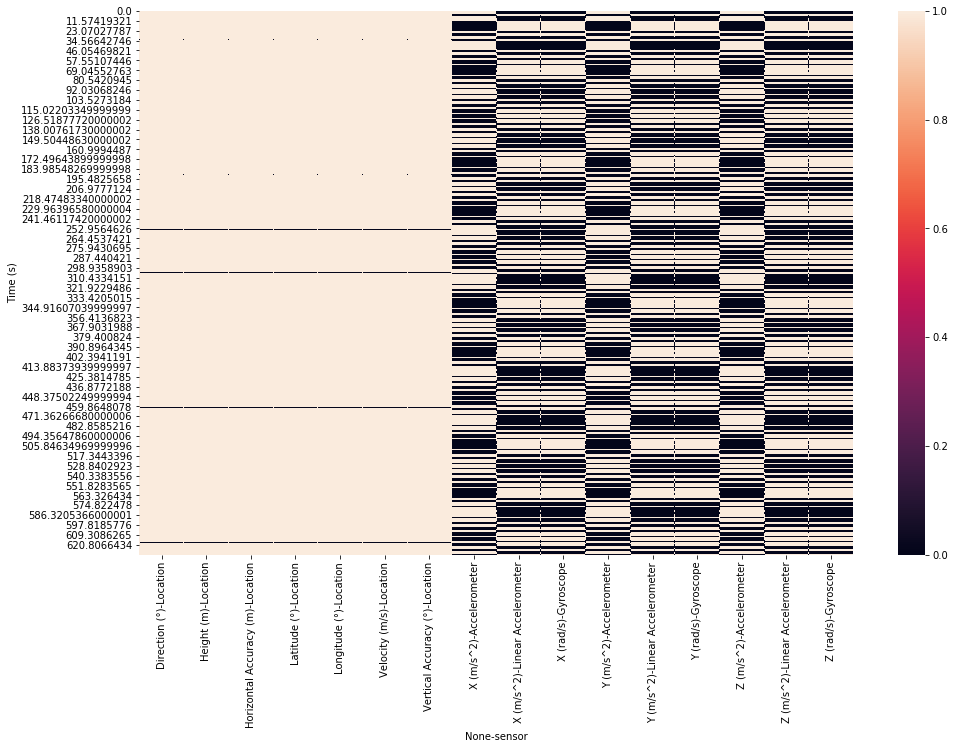

In [167]:
sns.heatmap(test.isna())

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62966 entries, 0 to 62965
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Latitude (°)             631 non-null    float64
 1   Longitude (°)            631 non-null    float64
 2   Height (m)               631 non-null    float64
 3   Velocity (m/s)           631 non-null    float64
 4   Direction (°)            631 non-null    float64
 5   Horizontal Accuracy (m)  631 non-null    float64
 6   Vertical Accuracy (°)    631 non-null    float64
 7   X (m/s^2)                62951 non-null  float64
 8   Y (m/s^2)                62951 non-null  float64
 9   Z (m/s^2)                62951 non-null  float64
 10  X (rad/s)                62951 non-null  float64
 11  Y (rad/s)                62951 non-null  float64
 12  Z (rad/s)                62951 non-null  float64
 13  Time (s)                 62966 non-null  float64
 14  X (m/s^2)             

In [67]:
df.describe()

,Latitude (°),Longitude (°),Height (m),Velocity (m/s),Direction (°),Horizontal Accuracy (m),Vertical Accuracy (°),X (m/s^2),Y (m/s^2),Z (m/s^2),X (rad/s),Y (rad/s),Z (rad/s),Time (s),X (m/s^2),Y (m/s^2),Z (m/s^2)
count,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,62951.000000,62951.000000,62951.000000,62951.000000,62951.000000,62951.000000,62966.000000,62966.000000,62966.000000,62966.000000
mean,47.706067,17.706092,118.404886,15.918710,198.152300,10.036123,10.036123,-0.079382,-0.012316,-0.028826,-0.000644,-0.001393,-0.007485,316.118133,0.093499,-0.264361,9.739353
std,0.005536,0.011677,2.906662,6.182333,111.210016,16.603497,16.603497,1.354332,0.552350,0.310726,0.022619,0.020079,0.147193,182.521461,1.595602,0.833039,0.308696
min,47.693402,17.687561,103.454252,-1.000000,-1.000000,4.000604,4.000604,-8.317548,-4.397162,-4.327921,-0.213253,-0.526529,-0.696578,0.000000,-8.780441,-6.176755,5.997877
25%,47.704902,17.693822,116.289695,11.551962,86.613785,8.001208,8.001208,-0.178717,-0.162184,-0.199854,-0.012490,-0.010707,-0.013388,158.051894,-0.215701,-0.508343,9.572743
50%,47.705995,17.710506,117.162605,18.448032,189.694571,8.001208,8.001208,-0.009901,-0.014963,-0.025149,-0.000026,-0.001488,0.000079,316.113910,0.094603,-0.253648,9.746083
75%,47.706672,17.716316,120.335795,20.381501,277.020279,12.001812,12.001812,0.168285,0.122561,0.145786,0.011656,0.007888,0.008677,474.181935,0.436792,0.012125,9.912799
max,47.717992,17.726061,127.877386,25.973469,358.060730,418.967358,418.967358,7.514613,3.738096,3.481913,0.201220,0.139472,0.759036,632.254525,7.336544,3.783233,13.257331


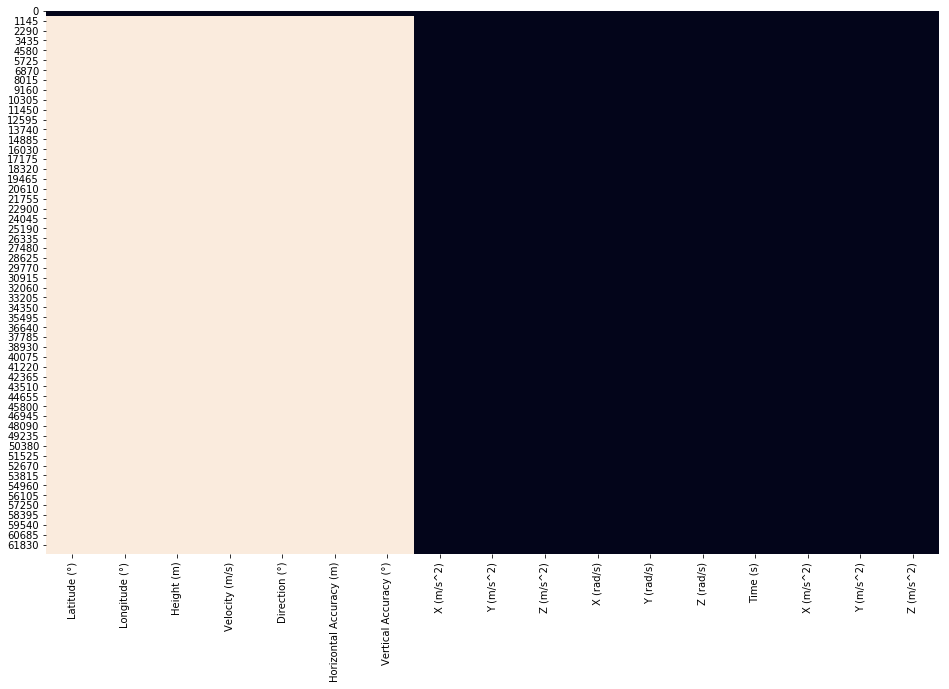

In [68]:
sns.heatmap(df.sort_values("Time (s)").isna(), annot=False, cbar=False)

plt.savefig("../reports/samplerate_cmap.png")

The signals from gps sensor seams to be very undersampled, and the signals from the gyroscape aren't really good. 
Some data exploration is needed to check weather the date useful

Checking the signals from each signal

In [69]:
df = df.sort_values("Time (s)")

In [70]:
fig = go.Figure()

trace = go.Scatter(
x = df["Time (s)"],
y = df["X (rad/s)"],
mode =  "lines",
connectgaps = True)

fig.add_trace(trace)

In [71]:
df.columns

Index(['Latitude (°)', 'Longitude (°)', 'Height (m)', 'Velocity (m/s)',
       'Direction (°)', 'Horizontal Accuracy (m)', 'Vertical Accuracy (°)',
       'X (m/s^2)', 'Y (m/s^2)', 'Z (m/s^2)', 'X (rad/s)', 'Y (rad/s)',
       'Z (rad/s)', 'Time (s)', 'X (m/s^2)', 'Y (m/s^2)', 'Z (m/s^2)'],
      dtype='object')

### Checking the gps signal 

In [72]:
fig = px.scatter_mapbox(df, lat="Latitude (°)", lon="Longitude (°)",zoom = 12, height=300)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

###  Read all  reference measuremetns

In [73]:
df.columns

Index(['Latitude (°)', 'Longitude (°)', 'Height (m)', 'Velocity (m/s)',
       'Direction (°)', 'Horizontal Accuracy (m)', 'Vertical Accuracy (°)',
       'X (m/s^2)', 'Y (m/s^2)', 'Z (m/s^2)', 'X (rad/s)', 'Y (rad/s)',
       'Z (rad/s)', 'Time (s)', 'X (m/s^2)', 'Y (m/s^2)', 'Z (m/s^2)'],
      dtype='object')

In [89]:
def read_all():
    
    q1 = read_measurement("../data/raw_data_train/rsq_q1/*")
    q1["label"] = 0
    q2 = read_measurement("../data/raw_data_train/rsq_q2/*")
    q2["label"] = 1
    q3 = read_measurement("../data/raw_data_train/rsq_q3/*")
    q3["label"] = 2
    
    df = pd.concat([q1,q2,q3],axis=0)
    #new columns
    df.columns = ["lat", "lon", "height", 
                  "velocity", "direction",
                  "h_accuracy", "v_accuracy", 
                  "x_lin_acc", "y_lin_acc", "z_lin_acc", 
                  "x_gyro", "y_gyro", "z_gyro",
                  "time", 
                  "x_acc","y_acc","z_acc", "label"]
    
    cols = list(df.columns)
    cols.remove("time")
    return df[["time"] + cols]

In [90]:
df_all = read_all()

../data/raw_data_train/rsq_q1\Accelerometer.csv
../data/raw_data_train/rsq_q1\Gyroscope.csv
../data/raw_data_train/rsq_q1\Linear Accelerometer.csv
../data/raw_data_train/rsq_q1\Location.csv
../data/raw_data_train/rsq_q2\Accelerometer.csv
../data/raw_data_train/rsq_q2\Gyroscope.csv
../data/raw_data_train/rsq_q2\Linear Accelerometer.csv
../data/raw_data_train/rsq_q2\Location.csv
../data/raw_data_train/rsq_q3\Accelerometer.csv
../data/raw_data_train/rsq_q3\Gyroscope.csv
../data/raw_data_train/rsq_q3\Linear Accelerometer.csv
../data/raw_data_train/rsq_q3\Location.csv


In [91]:
df_all.sort_values(["label","time"], inplace=True)
df_all.head()

,time,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,x_lin_acc,y_lin_acc,z_lin_acc,x_gyro,y_gyro,z_gyro,x_acc,y_acc,z_acc,label
0,0.000000,47.696266,17.726061,118.349480,-1.000000,-1.0,418.967358,418.967358,-0.068991,0.116175,-0.231500,-0.010804,0.001345,-0.033967,0.131427,-0.151186,9.977951,0
1,0.010040,47.695267,17.724532,120.897892,10.737622,-1.0,48.000000,48.000000,0.119553,0.105636,-0.053966,0.001346,0.008800,-0.035701,-0.003143,-0.063917,9.864187,0
2,0.020081,47.695335,17.724412,103.454252,11.802929,-1.0,32.000000,32.000000,0.013766,-0.061842,-0.085847,-0.007075,0.005302,-0.027966,0.059127,-0.115410,9.749825,0
3,0.030121,47.695273,17.724272,114.860346,11.802929,-1.0,32.000000,32.000000,0.063374,0.128633,-0.271607,-0.007945,0.006663,-0.028829,0.008233,-0.185913,9.694440,0
4,0.040161,47.695239,17.724124,116.224856,12.074264,-1.0,16.000000,16.000000,0.089934,0.096254,-0.355428,-0.004748,-0.002140,-0.035702,0.092358,-0.152832,9.726773,0


In [92]:
fig = px.scatter_mapbox(df_all, 
                        lat="lat", 
                        lon="lon",
                        zoom = 12, 
                        height=300, 
                        color = "label", 
                        color_continuous_scale=["green","blue","red"])
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Checking the Sample rate for each signal

In [93]:
df_all[np.where(~df_all["x_acc"].isna(), True, False)]

,time,lat,lon,height,velocity,direction,h_accuracy,v_accuracy,x_lin_acc,y_lin_acc,z_lin_acc,x_gyro,y_gyro,z_gyro,x_acc,y_acc,z_acc,label
0,0.000000,47.696266,17.726061,118.349480,-1.000000,-1.0,418.967358,418.967358,-0.068991,0.116175,-0.231500,-0.010804,0.001345,-0.033967,0.131427,-0.151186,9.977951,0
1,0.010040,47.695267,17.724532,120.897892,10.737622,-1.0,48.000000,48.000000,0.119553,0.105636,-0.053966,0.001346,0.008800,-0.035701,-0.003143,-0.063917,9.864187,0
2,0.020081,47.695335,17.724412,103.454252,11.802929,-1.0,32.000000,32.000000,0.013766,-0.061842,-0.085847,-0.007075,0.005302,-0.027966,0.059127,-0.115410,9.749825,0
3,0.030121,47.695273,17.724272,114.860346,11.802929,-1.0,32.000000,32.000000,0.063374,0.128633,-0.271607,-0.007945,0.006663,-0.028829,0.008233,-0.185913,9.694440,0
4,0.040161,47.695239,17.724124,116.224856,12.074264,-1.0,16.000000,16.000000,0.089934,0.096254,-0.355428,-0.004748,-0.002140,-0.035702,0.092358,-0.152832,9.726773,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12824,128.762562,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.224533,-0.329914,9.992920,2
12825,128.772603,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.070952,-0.128583,9.599238,2
12826,128.782643,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.276774,-0.104632,9.185050,2
12827,128.792683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.597857,-0.419577,9.109157,2


In [103]:
from collections import Counter

def check_sample_rate(df, signal_name):
    """Gives back the sample rate for a specific signal"""
    new_df = df[np.where(~df[signal_name].isna(), True, False)]
    
    new_df["shift"] = new_df["time"].shift()
    
    new_df["sample_rate"] = new_df["time"] - new_df["shift"]
    c = Counter(new_df["sample_rate"].apply(lambda x: round(x,3)).values)
    c.most_common(3)

    return c.most_common(3)
    
    

#### Sample rate for the signals

In [109]:
for i in df_all.columns:
    if i == "time" or i == "label":
        continue

    sample_rates = check_sample_rate(df_all, i)
    print("The sample rates of {}: ".format(i),sample_rates )

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\users\mesza\.virtualenvs\road-surface-quality-7nv9hwjf\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



The sample rates of lat:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of lon:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of height:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of velocity:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of direction:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of h_accuracy:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of v_accuracy:  [(0.01, 946), (nan, 1), (-6.325, 1)]
The sample rates of x_lin_acc:  [(0.01, 94501), (nan, 1), (-632.104, 1)]
The sample rates of y_lin_acc:  [(0.01, 94501), (nan, 1), (-632.104, 1)]
The sample rates of z_lin_acc:  [(0.01, 94501), (nan, 1), (-632.104, 1)]
The sample rates of x_gyro:  [(0.01, 94501), (nan, 1), (-632.104, 1)]
The sample rates of y_gyro:  [(0.01, 94501), (nan, 1), (-632.104, 1)]
The sample rates of z_gyro:  [(0.01, 94501), (nan, 1), (-632.104, 1)]
The sample rates of x_acc:  [(0.01, 94548), (nan, 1), (-632.255, 1)]
The sample rates of y_acc:  [(0.0

In [105]:
test

[(0.01, 94548), (nan, 1), (-632.255, 1)]

In [96]:
test.dropna().apply(lambda x: round(x,2)).unique()

array([ 1.0000e-02, -6.3225e+02, -1.8831e+02])